In [69]:
import sys
# !{sys.executable} -m pip install ace_tools

Defaulting to user installation because normal site-packages is not writeable


In [14]:
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import Point, Polygon
from shapely.wkt import loads  # For converting WKT strings to shapely objects
import osmnx as ox
from osgeo import ogr
from shapely import wkt
import os
idx = pd.IndexSlice

In [15]:
# Toggle between users

upath = r'/home/babakebrahimi/s3/data'

In [3]:
### Joining energy data ###

# Load the datasets
df_consommation = pd.read_csv(r'/home/babakebrahimi/s3/data/France/energy_data/Rennes_detail_data/td002_consommation.csv')
df_geocoded_org = pd.read_csv(r'/home/babakebrahimi/s3/data/France/energy_data/Rennes_detail_data/td001_dpe-clean-geocoded-tvtr-enriched-35.csv', low_memory=False)

# Filter residential buildings (SFH & AB)
df_geocoded = df_geocoded_org[df_geocoded_org['tr002_type_batiment_code'].isin(['TR002_001', 'TR002_002'])] 

# Filter only relevant rows where tr006_type_usage_id is 1, 2, or 11
df_filtered = df_consommation[df_consommation['tr006_type_usage_id'].isin([1, 2, 11])]

# Aggregate energy consumption by summing values per 'td001_dpe_id' and 'tr006_type_usage_id'
df_summed = df_filtered.groupby(['td001_dpe_id', 'tr006_type_usage_id'], as_index=False)['consommation_energie_finale'].sum()

# Pivot the data to restructure it
df_pivoted = df_summed.pivot(
    index='td001_dpe_id', 
    columns='tr006_type_usage_id', 
    values='consommation_energie_finale'
).reset_index()

# Rename columns to match required format
df_pivoted.columns = ['td001_dpe_id'] + [f'consommation_energie_finale_{col}' for col in df_pivoted.columns[1:]]

# Merge with the geocoded dataset
merged_df = df_geocoded.merge(df_pivoted, left_on='id', right_on='td001_dpe_id', how='left')

# Drop redundant column
merged_df.drop(columns=['td001_dpe_id'], inplace=True)

# Save the cleaned and merged dataset
output_path = r'/home/babakebrahimi/s3/data/France/energy_data/Rennes_detail_data/Rennes_merged_energy.csv'
merged_df.to_csv(output_path, index=False)

print(f"Data successfully merged and saved as '{output_path}'")

Data successfully merged and saved as '/home/babakebrahimi/s3/data/France/energy_data/Rennes_detail_data/Rennes_merged_energy.csv'


In [4]:

def filter_residential_buildings(csv_path, output_path):
    """
    Filter residential buildings in Rennes, France from a CSV file using OpenStreetMap.

    Parameters:
        csv_path (str): Path to the CSV file containing building data (must include latitude and longitude columns).
        output_path (str): Path to save the filtered CSV file.
    """
    # Step 1: Get the boundary for Rennes, France
    print("Fetching Rennes boundary from OpenStreetMap...")
    rennes_boundary = ox.geocode_to_gdf("Rennes, France")

    # Step 2: Read the large CSV file
    print("Reading CSV file...")
    buildings_csv = pd.read_csv(csv_path, low_memory=False)

    # Step 3: Convert latitude and longitude to numeric, handling errors
    print("Cleaning latitude and longitude columns...")
    buildings_csv["latitude"] = pd.to_numeric(buildings_csv["latitude"], errors="coerce")
    buildings_csv["longitude"] = pd.to_numeric(buildings_csv["longitude"], errors="coerce")

    # Remove rows with missing or invalid latitude/longitude
    buildings_csv = buildings_csv.dropna(subset=["latitude", "longitude"])

    # Step 4: Ensure the CSV file has a geometry column (convert lat/lon to Points)
    buildings_csv["geometry"] = buildings_csv.apply(
        lambda row: Point(row["longitude"], row["latitude"]), axis=1
    )

    # Convert CSV to GeoDataFrame
    buildings_gdf = gpd.GeoDataFrame(buildings_csv, geometry="geometry", crs="EPSG:4326")

    # Step 5: Reproject Rennes boundary to match the CSV CRS
    print("Reprojecting data to the same CRS...")
    rennes_boundary = rennes_boundary.to_crs(buildings_gdf.crs)

    # Step 6: Filter buildings within Rennes boundary
    print("Filtering buildings within Rennes boundary...")
    buildings_gdf['within_boundary'] = buildings_gdf.geometry.within(rennes_boundary.unary_union)

    # Keep only buildings within the boundary
    filtered_buildings = buildings_gdf[buildings_gdf['within_boundary']].drop(columns=['within_boundary'])

    # Step 7: Save the filtered buildings to a CSV
    print("Saving filtered buildings to CSV...")
    filtered_buildings.to_csv(output_path, index=False)

    print(f"Filtered data saved to {output_path}")



In [5]:
# Example usage
csv_path = r'/home/babakebrahimi/s3/data/France/energy_data/Rennes_detail_data/Rennes_merged_energy.csv'  # Replace with your CSV file path 
output_path = r'/home/babakebrahimi/s3/data/France/energy_data/Rennes_detail_data/rennes_buildings_detail.csv'  # Replace with desired output path
filter_residential_buildings(csv_path, output_path)

Fetching Rennes boundary from OpenStreetMap...
Reading CSV file...
Cleaning latitude and longitude columns...
Reprojecting data to the same CRS...
Filtering buildings within Rennes boundary...


/tmp/ipykernel_110/1756305913.py:39: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  buildings_gdf['within_boundary'] = buildings_gdf.geometry.within(rennes_boundary.unary_union)


Saving filtered buildings to CSV...
Filtered data saved to /home/babakebrahimi/s3/data/France/energy_data/Rennes_detail_data/rennes_buildings_detail.csv


In [6]:

# Step 1: Read the CSV file
rennes = pd.read_csv(r'/home/babakebrahimi/s3/data/France/energy_data/Rennes_detail_data/rennes_buildings_detail.csv', low_memory=False)

# Step 2: Convert the "geometry" column to shapely objects
# If the geometry is in WKT format, convert it to shapely geometry
if 'geometry' in rennes.columns:
    rennes['geometry'] = rennes['geometry'].apply(loads)
else:
    raise ValueError("The CSV file does not have a 'geometry' column.")

# Step 3: Convert the DataFrame to a GeoDataFrame
# Specify the CRS of the geometries. Adjust "EPSG:4326" to match your data's CRS.
rennes_gdf = gpd.GeoDataFrame(rennes, geometry='geometry', crs='EPSG:4326')


In [4]:

# Read the CSV file
rennes_df = gpd.read_file(r'/home/babakebrahimi/s3/data/France/CityGML/Rennes/v_batiment_desc.csv')

# Convert the 'shape' column to geometry
rennes_df['geometry'] = rennes_df['shape'].apply(wkt.loads)  # Assuming 'shape' column contains WKT strings

# Create a GeoDataFrame and set the CRS to EPSG:3948
rennes_gml = gpd.GeoDataFrame(rennes_df, geometry='geometry', crs='EPSG:3948')

# Reproject the geometries to EPSG:4326
# rennes_gml = rennes_gdf.to_crs('EPSG:4326')

rennes_gml.to_file(r'/home/babakebrahimi/s3/data/France/rennes_gml_building.sqlite', driver="SQLite")


In [6]:
# calculating shared walls between buildings
def Shared_wall(read_sqlite, write_sqlite):
    # Read the shapefile
    building = gpd.read_file(read_sqlite).to_crs('EPSG:3857')  # Assume initial projection to metric system

    # Create empty columns for NEIGHBORS, WALL_LENGTH, WALL_HEIGHT, SHARED_WALL
    building['NEIGHBORS'] = None
    building['WALL_LENGTH'] = None
    building['WALL_HEIGHT'] = None
    building['SHARED_WALL'] = None

    # Create a spatial index to speed up intersection checks
    spatial_index = building.sindex

    neighbors_list = []
    wall_length_list = []
    wall_height_list = []
    shared_wall_list = []

    # Get the total number of buildings for percentage tracking
    total_buildings = len(building)
    last_printed_percentage = 0

    # Iterate through each building
    for index, row in building.iterrows():
        # Calculate the current percentage of progress
        current_percentage = (index / total_buildings) * 100
        
        # Only print the progress if it exceeds the last printed by 5%
        if current_percentage - last_printed_percentage >= 5:
            print(f"Progress: {int(current_percentage)}%")
            last_printed_percentage = int(current_percentage)

        # Find potential neighbors using the spatial index (bounding box first for speed)
        possible_matches_index = list(spatial_index.intersection(row.geometry.bounds))
        possible_matches = building.iloc[possible_matches_index]

        # Now filter by actual intersection (geometry)
        intersecting_buildings = possible_matches[~possible_matches.geometry.disjoint(row.geometry)]

        # Get the list of 'id' for these buildings, excluding self
        neighbors = intersecting_buildings[intersecting_buildings['id_bati3d'] != row['id_bati3d']]['id_bati3d'].tolist()
        neighbors_list.append(neighbors)

        # Calculate shared wall lengths and heights for neighbors
        wall_lengths = []
        wall_heights = []
        shared_wall_areas = []

        for neighbor_id in neighbors:
            neighbor_row = building[building['id_bati3d'] == neighbor_id].iloc[0]

            # Calculate the shared wall length
            shared_length = row.geometry.intersection(neighbor_row.geometry).length
            wall_lengths.append(shared_length)

            # Calculate shared wall height (min of two buildings)
            shared_height = min(row['zmin'], neighbor_row['zmin'])
            wall_heights.append(shared_height)
            
            # print('------------')
            # print(type(shared_length), shared_length)
            # print(type(shared_height), shared_height)

            # Calculate the shared wall area
            shared_wall_areas.append(shared_length * float(shared_height))

        wall_length_list.append(wall_lengths)
        wall_height_list.append(wall_heights)
        shared_wall_list.append(sum(shared_wall_areas))

    # Assign computed lists back to the building DataFrame
    building['NEIGHBORS'] = neighbors_list
    building['WALL_LENGTH'] = wall_length_list
    building['WALL_HEIGHT'] = wall_height_list
    building['SHARED_WALL'] = shared_wall_list

    # Final 100% progress
    print("Progress: 100% - Completed")

    # Save the result to a new shapefile, first converting back to EPSG:4326 (latitude/longitude)
    return building.to_crs(epsg=4326).to_file(write_sqlite, driver='SQLite')

In [7]:
%%time
Shared_wall(r'/home/babakebrahimi/s3/data/France/rennes_gml_building.sqlite',
            r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall.sqlite')

Progress: 5%
Progress: 10%
Progress: 15%
Progress: 20%
Progress: 25%
Progress: 30%
Progress: 35%
Progress: 40%
Progress: 45%
Progress: 50%
Progress: 55%
Progress: 60%
Progress: 65%
Progress: 70%
Progress: 75%
Progress: 80%
Progress: 85%
Progress: 90%
Progress: 95%
Progress: 100% - Completed
CPU times: user 35min 55s, sys: 2.02 s, total: 35min 57s
Wall time: 36min 18s


In [7]:
rennes_gml = gpd.read_file(r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall.sqlite')

# Drop duplicate rows based on 'id_bati3d'
rennes_gml = rennes_gml.drop_duplicates(subset="id_bati3d", keep="first")

# List of columns to remove
columns_to_remove = [
    'niveau', 'nb_logement', 'nb_maison', 'nb_appart', 'nb_loc_comm', 'nb_dep',
    'surf_locaux', 'surf_locaux_hab', 'surf_locaux_dep_hab', 'surf_locaux_dep',
    'surf_locaux_pro', 'nb_bati_majic', 'shape', 'nom_methode_dpe', 'version_methode_dpe',
    'date_etablissement_dpe', 'consommation_energie',
    'classe_consommation_energie', 'estimation_ges',
    'classe_estimation_ges', 'annee_construction', 'surface_thermique_lot',
    'tr001_modele_dpe_type_libelle', 'tr002_type_batiment_description',
    'code_insee_commune_actualise', 'tv016_departement_code', 'geo_adresse',
    'geo_score'
]

# Drop specified columns
rennes_gml = rennes_gml.drop(columns=columns_to_remove, errors="ignore")

In [8]:
# Ensure CRS alignment
if rennes_gml.crs != rennes_gdf.crs:
    rennes_gdf = rennes_gdf.to_crs(rennes_gml.crs)

overlay_result = []
# Perform lefthand overlay
overlay_result = rennes_gml.sjoin(rennes_gdf, how='left')

# Drop rows where 'consommation_energie' is NaN
overlay_result = overlay_result.dropna(subset=['consommation_energie'])


In [9]:
# Save or inspect the result
overlay_result.to_file(r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall_v2.sqlite', driver="SQLite")  # Save as SQLite

The daily average air temperature data are extracted from Meteostat: https://meteostat.net/en/place/fr/rennes?s=07130&t=2014-01-01/2020-12-31

In [157]:
# # Python script to calculate number of heating days for different years

# # Daily average temperatures in Celsius for different years
# temperature_data = pd.read_excel(r'/home/babakebrahimi/s3/data/France/climate_data/Rennes_avg_daily.xlsx')

# # Convert the 'date' column to datetime, assuming the format is 'YYYY-MM-DD'
# temperature_data['date'] = pd.to_datetime(temperature_data['date'], format='%Y-%m-%d')

# # Extract year from the date
# temperature_data['year'] = temperature_data['date'].dt.year

# # Reference temperature in Celsius
# reference_temperature = 9

# # Function to calculate the number of heating days
# def calculate_heating_days(temperatures, ref_temp):
#     hdd_total = 0
#     for temp in temperatures:
#         if temp <= ref_temp:
#             hdd_total += 1
#     return hdd_total

# # Use the 'tavg' attribute for the daily average temperature instead of 'Middeltemperatur (døgn)'
# hdd_per_year = {}
# for year, group in temperature_data.groupby('year'):
#     temperatures = group['tavg']  # assuming the daily average temperatures are stored in a column called 'tavg'
#     hdd_per_year[year] = calculate_heating_days(temperatures, reference_temperature)

# # Print the number of heating days for each year
# for year, hdd in hdd_per_year.items():
#     print(f"Total Heating Days for {year}: {hdd}")

Total Heating Days for 2014: 101
Total Heating Days for 2015: 92
Total Heating Days for 2016: 136
Total Heating Days for 2017: 111
Total Heating Days for 2018: 106
Total Heating Days for 2019: 114
Total Heating Days for 2020: 88


In [11]:
# A dictionary with the specified keys and values for covered buildings in Rennes
building_types = {
    "AB": "TR002_002",
    "SFH": "TR002_001"
}

# Number of heating days (heating degree days)
year_vv_dict = {year: 90 for year in range(2014, 2022)}

In [7]:
def QH_calc(read_file, write_file):
    
    # Extracting parts of TABULA spreadsheet
    buil_set = pd.read_excel(os.path.join(upath, 'tabula-episcope', 'subset_TABULA.xlsx'))
    sys_set = pd.read_excel(os.path.join(upath, 'tabula-episcope', 'TABULA_sys_set_FR.xlsx'))
    
    # Removing rows that don't represent a country 
    buil_set = buil_set[buil_set['Code_Country'].notna()]
    buil_set = buil_set[buil_set['Description_BuildingVariant'].notna()]
    buil_set = buil_set[buil_set['Code_Country'] != 'XX']

    # Creating a multiindex
    buil_set.set_index(['Code_Country', 'Code_DataType_Building', 'Name_ClimateRegion', 
                        'Description_BuildingVariant', 'Code_BuildingSizeClass', 
                        'Year1_Building', 'Year2_Building'], inplace=True)

    buil_set = buil_set.sort_index(level=[0, 1, 2, 3, 4])

    # Creating a multiindex for system set
    sys_set.set_index(['Code_BuildingVariant'], inplace=True)
    sys_set = sys_set.sort_index(level=[0])

    # Reading the generated shapefile containing building info   
    bolig = gpd.read_file(read_file).to_crs('EPSG:3857').reset_index(drop=True)
    
    # Convert 'jannat' column to numeric, forcing errors to NaN
    bolig['jannat'] = pd.to_numeric(bolig['jannat'], errors='coerce')  # Converts non-numeric values to NaN

    # Define constants
    CO = 'FR'
    Typo = 'ReEx'
    Cl = 'National'
    COND_dic = {
        1: ['Existing state of the buidling'],
        2: ['Complead refurbishment, standard solutions'],
        3: ['Complead refurbishment, advanced solutions']
    }
        # Looping through building energy performance levels
    for c in [2]:
        for YY, VV in year_vv_dict.items():
            for BRA in [1]:
                for WR in [0.8]:
                    print(YY, '--', BRA, '--', WR)
                    
                    for index, row in bolig.iterrows():
                        
                        # Check if the 'year' in the row matches YY 
                        if int(row['date_etablissement_dpe'].split('-')[0]) != YY:
                            # Skip to the next row if year doesn't match
                            continue
                            
                        for i, j in building_types.items():
                            if row['tr002_type_batiment_code'] in j:
                                B_type = i
                                break
                       
                        Y = row['jannat']
                        if pd.isna(Y):  # Skip if 'jannat' is NaN
                            continue
                        
                        # Creating a multiindex element
                        i = None
                        for a in buil_set.loc[(CO, Typo, Cl, COND_dic[c], B_type)].index:
                            if a[-2] <= Y <= a[-1]:
                                y0, y1 = a[-2], a[-1]
                                i = (CO, Typo, Cl, COND_dic[c], B_type, y0, y1)
                                break
                        
                        if i is None:
                            continue  # Skip if no matching index found
                        
                        try:
                            if 0 <= Y <= 1914:
                                sys_i = f"{CO}.N.{B_type}.01.Gen.{Typo}.001.00{c}"
                            elif 1915 <= Y <= 1948:
                                sys_i = f"{CO}.N.{B_type}.02.Gen.{Typo}.001.00{c}"
                            elif 1949 <= Y <= 1967:
                                sys_i = f"{CO}.N.{B_type}.03.Gen.{Typo}.001.00{c}"
                            elif 1968 <= Y <= 1974:
                                sys_i = f"{CO}.N.{B_type}.04.Gen.{Typo}.001.00{c}"
                            elif 1975 <= Y <= 1981:
                                sys_i = f"{CO}.N.{B_type}.05.Gen.{Typo}.001.00{c}"
                            elif 1982 <= Y <= 1989:
                                sys_i = f"{CO}.N.{B_type}.06.Gen.{Typo}.001.00{c}"
                            elif 1990 <= Y <= 1999:
                                sys_i = f"{CO}.N.{B_type}.07.Gen.{Typo}.001.00{c}"
                            elif 2000 <= Y <= 2005:
                                sys_i = f"{CO}.N.{B_type}.08.Gen.{Typo}.001.00{c}"
                            elif 2006 <= Y <= 2012:
                                sys_i = f"{CO}.N.{B_type}.09.Gen.{Typo}.001.00{c}"
                            elif 2013 <= Y <= 9999:
                                sys_i = f"{CO}.N.{B_type}.10.Gen.{Typo}.001.00{c}"
                            else:
                                raise ValueError("Unexpected value of Y:", Y)
                        except Exception as e:
                            print("Error:", e)
                            continue  # Skip to next iteration

                        # Estimated air-conditioned area
                        A_C_est = BRA * row['geometry'].area

                        # Estimated areas
                        A_roof_est = BRA * row['geometry'].area
                        A_floor_est = BRA * row['geometry'].area
                        A_wall_est = WR * ((row.geometry.length * float(row['zmin']) - row['shared_wall']) * (1 - 0.13))
                        A_window_est = WR * ((row.geometry.length * float(row['zmin']) - row['shared_wall']) * 0.13)
                        A_door_est = 0
                    

                        # Heat transfer coefficients
                        Htr_roof = buil_set.loc[idx[i], 'U_Roof_1'].values * A_roof_est * buil_set.loc[idx[i], 'b_Transmission_Roof_1'].values
                        Htr_floor = buil_set.loc[idx[i], 'U_Floor_1'].values * A_floor_est * buil_set.loc[idx[i], 'b_Transmission_Floor_1'].values
                        Htr_wall = buil_set.loc[idx[i], 'U_Wall_1'].values * A_wall_est * buil_set.loc[idx[i], 'b_Transmission_Wall_1'].values
                        Htr_window = buil_set.loc[idx[i], 'U_Window_1'].values * A_window_est
                        Htr_door = buil_set.loc[idx[i], 'U_Door_1'].values * A_door_est
                        Htr_tb = buil_set.loc[idx[i], 'delta_U_ThermalBridging_Original'].values * (A_roof_est + A_floor_est + A_wall_est + A_window_est + A_door_est)

                        Htr = Htr_roof + Htr_floor + Htr_wall + Htr_window + Htr_door + Htr_tb

                        # Heat transfer by ventilation
                        Cp_air = 0.34
                        Hve = Cp_air * (buil_set.loc[idx[i], 'n_air_use'].values + buil_set.loc[idx[i], 'n_air_infiltration'].values) * A_C_est * buil_set.loc[idx[i], 'h_room'].values

                        # Internal temperature
                        if buil_set.loc[idx[i],'theta_i'].values >= 0:
                            int_tmp = buil_set.loc[idx[i], 'theta_i']
                        else:
                            int_tmp = buil_set.loc[idx[i], 'theta_i_htr1'].values + (Htr - 1) / 3 * (buil_set.loc[idx[i], 'theta_i_htr4'].values - buil_set.loc[idx[i], 'theta_i_htr1'].values)

                        tmp = (int_tmp - buil_set.loc[idx[i], 'Theta_e'].values) * VV

                        # Temperature reduction factor
                        if Htr / A_C_est <= 1:
                            Fred = min(buil_set.loc[idx[i], 'F_red_htr1'].values + (1 - 597 / 159.4) / 0.5 * (1 - buil_set.loc[idx[i], 'F_red_htr1'].values), 1)
                        elif Htr / A_C_est >= 4:
                            Fred = buil_set.loc[idx[i], 'F_red_htr4']
                        else:
                            Fred = buil_set.loc[idx[i], 'F_red_htr1'].values + (Htr / A_C_est - 1) * (buil_set.loc[idx[i], 'F_red_htr4'].values - buil_set.loc[idx[i], 'F_red_htr1'].values) / 3

                        Qht = (Htr + Hve) * Fred * (tmp * 0.024)

                        # Solar heat load
                        Qsol = 0
                        for w in ['Hor', 'East', 'South', 'West', 'North']:
                            if w == 'Hor':
                                Qsol += buil_set.loc[idx[i], 'F_sh_hor'].values * (1 - buil_set.loc[idx[i], 'F_f'].values) * buil_set.loc[idx[i], 'F_w'].values * buil_set.loc[idx[i], 'g_gl_n_Window_1'].values * 0 * buil_set.loc[idx[i], f'I_Sol_{w}'].values
                            else:
                                Qsol += buil_set.loc[idx[i], 'F_sh_vert'].values * (1 - buil_set.loc[idx[i], 'F_f'].values) * buil_set.loc[idx[i], 'F_w'].values * buil_set.loc[idx[i], 'g_gl_n_Window_1'].values * (A_window_est * 0.25) * buil_set.loc[idx[i], f'I_Sol_{w}'].values

                        # Internal heat source
                        Qint = 0.024 * buil_set.loc[idx[i], 'phi_int'].values * VV * A_C_est

                        # Constant parameter aH
                        aH = 0.8 + ((buil_set.loc[idx[i], 'c_m'].values * A_C_est / (Htr + Hve)) / 30)

                        # Heat balance ratio
                        lamd = (Qsol + Qint) / Qht

                        # Gain utilization factor for heating
                        mu = (1 - lamd ** aH) / (1 - lamd ** (aH + 1))

                        # Energy needed for heating
                        QH = Qht - mu * (Qsol + Qint)
                        
                        # print(QH.iloc[0] / A_C_est)
                        
                        # bolig.at[index, f'QH_(kWh/a).00{c}_{BRA}_{WR}{YY}'] = QH.iloc[0]
                        bolig.at[index, f'QH_(kWh/m2a).00{c}_{BRA}_{WR}{YY}'] = QH.iloc[0] / A_C_est

    return bolig.to_file(write_file, driver='SQLite')

In [165]:
%%time
QH_calc(r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall_v2.sqlite',
        r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall_renovated_90HDD_80%WR_jannat.sqlite')

2014 -- 1 -- 0.8
2015 -- 1 -- 0.8
2016 -- 1 -- 0.8
2017 -- 1 -- 0.8
2018 -- 1 -- 0.8
2019 -- 1 -- 0.8
2020 -- 1 -- 0.8
2021 -- 1 -- 0.8
CPU times: user 9min 28s, sys: 876 ms, total: 9min 29s
Wall time: 9min 44s


In [5]:
# Read as-built and renovated data

# Function to remove ".001" and ".002" from column names
def remove_suffixes(column_name):
    return column_name.replace('.001', '').replace('.002', '')

as_built = gpd.read_file(r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall_as-built_90HDD_80%WR_jannat.sqlite')
as_built['year'] = as_built['date_etablissement_dpe'].str.split('-').str[0].astype(int)

# Update column names in the DataFrame
as_built.columns = [remove_suffixes(col) for col in as_built.columns]

renovated = gpd.read_file(r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall_renovated_90HDD_80%WR_jannat.sqlite')

# Update column names in the DataFrame
renovated.columns = [remove_suffixes(col) for col in renovated.columns]
renovated['year'] = renovated['date_etablissement_dpe'].str.split('-').str[0].astype(int)


In [6]:
### Calculate energy per sqm ###

# Ensure 'surface_thermique_lot' is numeric before replacing values
as_built['surface_thermique_lot'] = pd.to_numeric(as_built['surface_thermique_lot'], errors='coerce')

# Replace zeros with NaN to avoid division by zero
as_built.loc[as_built['surface_thermique_lot'] == 0, 'surface_thermique_lot'] = pd.NA

# Create new attributes by dividing the respective values by 'surface_thermique_lot', handling NaN values
for col in ['consommation_energie_finale_1.0', 'consommation_energie_finale_2.0', 'consommation_energie_finale_11.0']:
    new_col = col + "_kWh/m2"
    as_built[new_col] = pd.to_numeric(as_built[col], errors='coerce').div(as_built['surface_thermique_lot'])


# Ensure 'surface_thermique_lot' is numeric before replacing values
renovated['surface_thermique_lot'] = pd.to_numeric(renovated['surface_thermique_lot'], errors='coerce')

# Replace zeros with NaN to avoid division by zero
renovated.loc[renovated['surface_thermique_lot'] == 0, 'surface_thermique_lot'] = pd.NA

# Create new attributes by dividing the respective values by 'surface_thermique_lot', handling NaN values
for col in ['consommation_energie_finale_1.0', 'consommation_energie_finale_2.0', 'consommation_energie_finale_11.0']:
    new_col = col + "_kWh/m2"
    renovated[new_col] = pd.to_numeric(renovated[col], errors='coerce').div(renovated['surface_thermique_lot'])

In [21]:
# Step 1: Load and Inspect the Data

# FCube_oslo_dat = pd.concat([renovated , as_built])
rennes_dat = []
rennes_dat = pd.concat([renovated[renovated['year']<2000] , as_built[as_built['year']>=2000]])

# creating two additional attribute showing building types based on 'byggtypeko' and cohort a building belongs to
def find_keys_by_value_in_list(d, target_value):
    keys = [key for key, values in d.items() if target_value in values]
    return keys
    
rennes_dat['bygg_type'] = [find_keys_by_value_in_list(building_types, i) for i in rennes_dat['tr002_type_batiment_code']]

# to ensure that we get no listed string
first_elements = []
# Loop through each element in the 'bygg_type' column
for i in rennes_dat['bygg_type']:
    # Check if the list is not empty
    if i:
        # Append the first element to the list of first elements
        first_elements.append(i[0])
    else:
        # If the list is empty, append None
        first_elements.append(None)
        
# Add the list of first elements as a new column 'bygg_type_v2'
rennes_dat['bygg_type_v2'] = first_elements

# Define the function to classify years into cohorts
def classify_year_to_cohort(Y):
    if 0 <= Y <= 1914:
        return '0_1914'
    elif 1915 <= Y <= 1948:
        return '1915_1948'
    elif 1949 <= Y <= 1967:
        return '1949_1967'
    elif 1968 <= Y <= 1974:
        return '1968_1974'
    elif 1975 <= Y <= 1981:
        return '1975_1981'
    elif 1982 <= Y <= 1989:
        return '1982_1989'
    elif 1990 <= Y <= 1999:
        return '1990_1999'
    elif 2000 <= Y <= 2005:
        return '2000_2005'
    elif 2006 <= Y <= 2012:
        return '2006_2012'
    elif 2013 <= Y <= 9999:
        return '2013_9999'
    else:
        return 'Unknown'                            

rennes_dat['cohort'] = rennes_dat['annee_construction'].apply(classify_year_to_cohort)

# Result placeholder
result = []

# Columns to check for duplicates
duplicate_columns = [
    'id_bati3d','zmin', 'year', 'bygg_type_v2', 'cohort','tr002_type_batiment_description',
    'annee_construction', 'nom_methode_dpe'
]

# Columns to average
# average_columns = [
#     'consommation_energie', 'qh_(kwh/m2a)_1_12011', 'qh_(kwh/m2a)_1_12012',
#     'qh_(kwh/m2a)_1_12013', 'qh_(kwh/m2a)_1_12014', 'qh_(kwh/m2a)_1_12015',
#     'qh_(kwh/m2a)_1_12016', 'qh_(kwh/m2a)_1_12017', 'qh_(kwh/m2a)_1_12018',
#     'qh_(kwh/m2a)_1_12019', 'qh_(kwh/m2a)_1_12020', 'qh_(kwh/m2a)_1_12021',
#     'consommation_energie_finale_1.0_kWh/m2', 'consommation_energie_finale_2.0_kWh/m2', 
#     'consommation_energie_finale_11.0_kWh/m2'
# ]

average_columns = [
    'consommation_energie', 'qh_(kwh/m2a)_1_0.82014', 'qh_(kwh/m2a)_1_0.82015',
    'qh_(kwh/m2a)_1_0.82016', 'qh_(kwh/m2a)_1_0.82017', 'qh_(kwh/m2a)_1_0.82018',
    'qh_(kwh/m2a)_1_0.82019', 'qh_(kwh/m2a)_1_0.82020', 'qh_(kwh/m2a)_1_0.82021',
    'consommation_energie_finale_1.0_kWh/m2', 'consommation_energie_finale_2.0_kWh/m2', 
    'consommation_energie_finale_11.0_kWh/m2'
]

# Check available columns in the DataFrame
available_columns = rennes_dat.columns

# Filter average_columns to include only those present in the DataFrame
average_columns_filtered = [col for col in average_columns if col in available_columns]

# Remove geometry from duplicate_columns for grouping
# grouping_columns = [col for col in duplicate_columns if col != 'geometry']

# Group by the columns used for finding duplicates
# grouped = rennes_dat.groupby(grouping_columns)

# # Calculate mean for the filtered average columns
# result = grouped[average_columns_filtered].mean(numeric_only=True).reset_index()

# # Handle geometry aggregation (optional)
# if 'geometry' in duplicate_columns:
#     # Take the first geometry for each group
#     result['geometry'] = grouped['geometry'].first()

# Update rennes_dat with the aggregated result
# rennes_dat = []
# rennes_dat = result


In [22]:
for i in ['AB', 'SFH']:
    for j in rennes_dat['cohort'].unique():
        locals()['percentile_90_'+i+'_'+j] = np.percentile(rennes_dat[(rennes_dat['bygg_type_v2']==i) & (rennes_dat['cohort']==j)]['consommation_energie'], 90)
        locals()['percentile_10_'+i+'_'+j] = np.percentile(rennes_dat[(rennes_dat['bygg_type_v2']==i) & (rennes_dat['cohort']==j)]['consommation_energie'], 10)

# Initialize an empty list to store the filtered DataFrames
filtered_dfs = []

# Loop through each combination of i and j
for i in ['AB', 'SFH']:
    for j in rennes_dat['cohort'].unique():
        # Filter the DataFrame based on the conditions and remove values above 1000 in the specified column
        filtered_df = rennes_dat[
            (rennes_dat['bygg_type_v2'] == i) &
            (rennes_dat['cohort'] == j) &
            (rennes_dat['consommation_energie'] <= locals()['percentile_90_'+i+'_'+j]) &
            (rennes_dat['consommation_energie'] >= locals()['percentile_10_'+i+'_'+j])
        ]
        # Append the filtered DataFrame to the list
        filtered_dfs.append(filtered_df)

# Concatenate all the filtered DataFrames into one final DataFrame
final_df = pd.concat(filtered_dfs, ignore_index=True)

In [11]:
final_df.to_csv(r'/home/babakebrahimi/s3/data/France/plot_rennes.csv')

In [13]:
final_df = pd.read_csv(r'/home/babakebrahimi/s3/data/France/plot_rennes.csv')

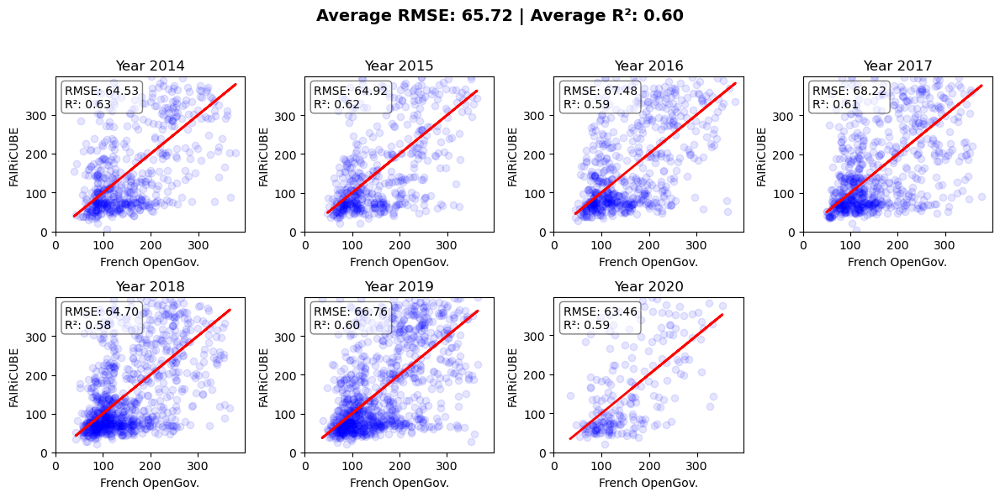

In [14]:
from sklearn.metrics import mean_squared_error, r2_score

# Function to calculate and display RMSE and R² for 2D data
def calculate_and_display_metrics(ax, true_x, true_y, pred_x, pred_y):
    """Compute RMSE and R² for 2D predictor and true values and display them on a subplot."""
    # Drop NaN values to avoid computation errors
    valid_data = np.isfinite(true_x) & np.isfinite(true_y) & np.isfinite(pred_x) & np.isfinite(pred_y)
    true_x, true_y, pred_x, pred_y = true_x[valid_data], true_y[valid_data], pred_x[valid_data], pred_y[valid_data]

    # Compute Euclidean distances for true and predicted points
    true_distances = np.sqrt(true_x**2 + true_y**2)
    pred_distances = np.sqrt(pred_x**2 + pred_y**2)

    # Compute RMSE and R² score
    mse = mean_squared_error(true_distances, pred_distances)
    rmse = np.sqrt(mse)  # Compute Root Mean Squared Error
    r2 = r2_score(true_distances, pred_distances)

    # Annotate metrics on the plot
    ax.text(0.05, 0.95, f'RMSE: {rmse:.2f}\nR²: {r2:.2f}', transform=ax.transAxes, 
            fontsize=10, verticalalignment='top', bbox=dict(boxstyle="round", facecolor="white", alpha=0.5))
    
    return rmse, r2

# List to hold available data indices
valid_years = []
rmse_values = []
r2_values = []

# Check available years dynamically
for i in range(8):
    column_name = 'qh_(kwh/m2a)_1_0.8' + str(2014 + i)
    if column_name in final_df.columns:
        data = final_df[(final_df['year'].astype(int) == 2014 + i) & 
                        (final_df[column_name] < 400) & 
                        (final_df['consommation_energie'] > 0) &
                        (final_df['annee_construction'] > 1) &
                        (final_df['nom_methode_dpe'].isin(['Méthode 3CL']))].copy()
        
        if not data.empty:  # Ensure the dataset is not empty before adding it
            valid_years.append(i)

# Dynamically set subplot grid size based on available data
n_subplots = len(valid_years)

if n_subplots == 0:
    print("No valid data available for any year.")
else:
    n_cols = 4  # Number of columns per row (adjustable)
    n_rows = int(np.ceil(n_subplots / n_cols))  # Calculate rows dynamically

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(12,6))
    axs = axs.flatten()  # Flatten in case of fewer subplots

    # Iterate over valid years
    for idx, i in enumerate(valid_years):
        column_name = 'qh_(kwh/m2a)_1_0.8' + str(2014 + i)

        data = final_df[(final_df['year'].astype(int) == 2014 + i) & 
                        (final_df[column_name] < 400) &
                        ((final_df['consommation_energie_finale_1.0_kWh/m2'] + final_df['consommation_energie_finale_2.0_kWh/m2']) < 400) &
                        (final_df['consommation_energie'] > 0) & 
                        (final_df['nom_methode_dpe'].isin(['Méthode 3CL']))].copy()
        
        # Ensure no missing values in key columns
        data = data[['consommation_energie_finale_1.0_kWh/m2', 'consommation_energie_finale_2.0_kWh/m2', column_name]].dropna()
        
        # Define true and predicted values correctly
        true_x = data['consommation_energie_finale_1.0_kWh/m2'] + data['consommation_energie_finale_2.0_kWh/m2'] 
        true_y = data['consommation_energie_finale_1.0_kWh/m2'] + data['consommation_energie_finale_2.0_kWh/m2']
        
        pred_x = data['consommation_energie_finale_1.0_kWh/m2'] + data['consommation_energie_finale_2.0_kWh/m2']
        pred_y = data[column_name]

        # Plot scatter
        axs[idx].scatter(true_x, pred_y, color='blue', marker='o', alpha=0.1, label='Observed vs Predicted')
        axs[idx].plot(true_x, true_x, color='red', linestyle='-', linewidth=2, label='Perfect Prediction (45°)')  # Diagonal reference line
        axs[idx].set_title(f'Year {2014 + i}')
        axs[idx].set_xlabel('French OpenGov.')
        axs[idx].set_ylabel('FAIRiCUBE')

        # Ensure identical x- and y-axis scales
        max_limit = max(true_x.max(), pred_y.max())
        axs[idx].set_xlim(0, max_limit)
        axs[idx].set_ylim(0, max_limit)

        # Calculate and display metrics
        rmse, r2 = calculate_and_display_metrics(axs[idx], true_x, true_y, pred_x, pred_y)
        rmse_values.append(rmse)
        r2_values.append(r2)
    
    # Compute average RMSE and R² scores
    avg_rmse = np.mean(rmse_values)
    avg_r2 = np.mean(r2_values)

    # Display average metrics in the plot
    fig.suptitle(f'Average RMSE: {avg_rmse:.2f} | Average R²: {avg_r2:.2f}', fontsize=14, fontweight='bold')

    # Hide unused subplots if there are fewer plots than grid spaces
    for j in range(idx + 1, len(axs)):
        fig.delaxes(axs[j])

    # Adjust layout and show plot
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for the suptitle
    plt.savefig("rennes_energy_use_esimate.png", dpi=300)
    plt.show()

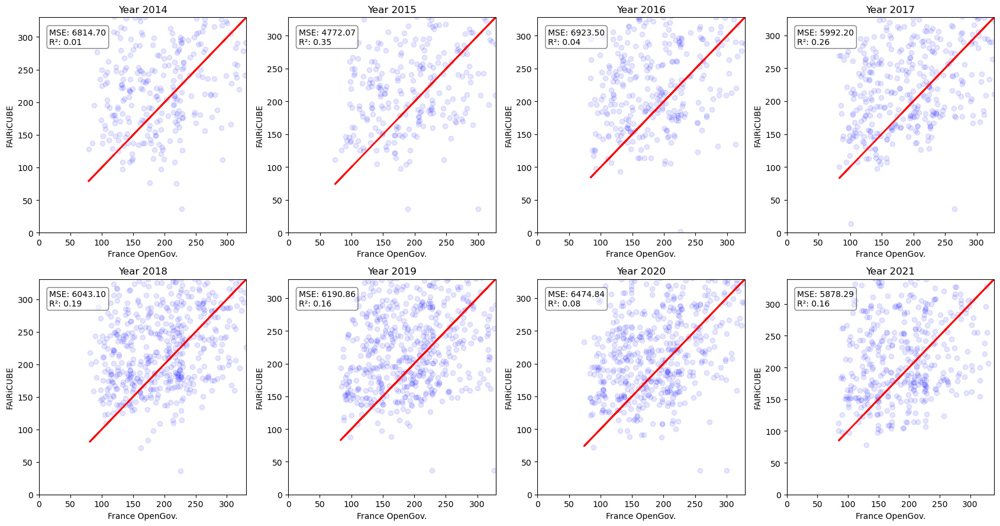

In [45]:
from sklearn.metrics import mean_squared_error, r2_score

# Function to calculate and display MSE and R² for 2D data
def calculate_and_display_metrics(ax, true_x, true_y, pred_x, pred_y):
    """
    Compute MSE and R² for 2D predictor and true values and display them on a subplot.

    Parameters:
        ax (matplotlib.axes.Axes): The axis to annotate the metrics.
        true_x (array-like): X-coordinates of true values.
        true_y (array-like): Y-coordinates of true values.
        pred_x (array-like): X-coordinates of predicted values.
        pred_y (array-like): Y-coordinates of predicted values.
    """
    # Compute Euclidean distances for true and predicted points
    true_distances = np.sqrt(true_x**2 + true_y**2)
    pred_distances = np.sqrt(pred_x**2 + pred_y**2)

    # Compute MSE and R² score
    mse = mean_squared_error(true_distances, pred_distances)
    r2 = r2_score(true_distances, pred_distances)

    # Annotate metrics on the plot
    ax.text(0.05, 0.95, f'MSE: {mse:.2f}\nR²: {r2:.2f}', transform=ax.transAxes, 
            fontsize=10, verticalalignment='top', bbox=dict(boxstyle="round", facecolor="white", alpha=0.5))
    return mse, r2


# Create a grid plot with 8 subplots arranged in a 2x4 grid
fig, axs = plt.subplots(2, 4, figsize=(17, 9))

# Flatten the axs array to easily access each subplot
axs = axs.flatten()

# Plot data in each subplot
for i in range(8):
    # Filter and sample 10% of the data
    data = final_df[(final_df['year'].astype(int) == 2014 + i) & 
                    (final_df['qh_(kwh/m2a)_1_1' + str(2014 + i)] < 400) & 
                    (final_df['consommation_energie'] > 0) & 
                    (final_df['nom_methode_dpe'].isin(['Méthode 3CL']))]
    
    true_x = data['consommation_energie_finale_1_kWh/m2']+data['consommation_energie_finale_2_kWh/m2']
    true_y = data['consommation_energie_finale_1_kWh/m2']+data['consommation_energie_finale_2_kWh/m2']
    
    pred_x = data['consommation_energie_finale_1_kWh/m2']+data['consommation_energie_finale_2_kWh/m2']
    pred_y = data['qh_(kwh/m2a)_1_1' + str(2014+i)]

    sampled_data = data.sample(frac=1, random_state=42)  # Randomly sample 10% of the data

    axs[i].scatter(true_x, pred_y, color='blue', marker='o', alpha=0.1, label='Observed vs Predicted')
    axs[i].plot(true_x, true_x, color='red', linestyle='-', linewidth=2, label='Perfect Prediction (45°)')  # Add diagonal line
    axs[i].set_title(f'Year {2014 + i}')
    axs[i].set_xlabel('France OpenGov.')
    axs[i].set_ylabel('FAIRiCUBE')

    # Ensure identical x- and y-axis scales
    max_limit = max(true_x.max(), true_y.max())
    axs[i].set_xlim(0, max_limit)
    axs[i].set_ylim(0, max_limit)

    # Calculate and display metrics
    calculate_and_display_metrics(axs[i], true_x, true_y, pred_x, pred_y)

# Adjust layout and show plot
plt.tight_layout()
plt.show()


In [ ]:
array(['3CL - DPE', 'Méthode 3CL', 'Méthode Facture', 'FACTURE - DPE',
       'TH_C_E', 'TROIS_CL_DPE', 'FACTURE', '3CL', 'Factures', 'th-CE',
       'FACTURE SEULE', 'Th-BCE', 'DPE VIERGE', '3CL-DPE', 'Th-C-E',
       'TH_BCE', 'DPE 3 cl'], dtype=object)

In [114]:
filtered_df = final_df[['consommation_energie', 'qh_(kwh/m2a)_1_12015']].dropna()

In [77]:
final_df.columns#[filtered_df['qh_(kwh/m2a)_1_12015']<0]

Index(['id_bati3d', 'zmin', 'year', 'bygg_type_v2', 'cohort',
       'tr002_type_batiment_description', 'annee_construction',
       'nom_methode_dpe', 'consommation_energie'],
      dtype='object')

In [23]:
final_df = gpd.read_file(r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall.sqlite')

Clipping data to Rennes boundary...


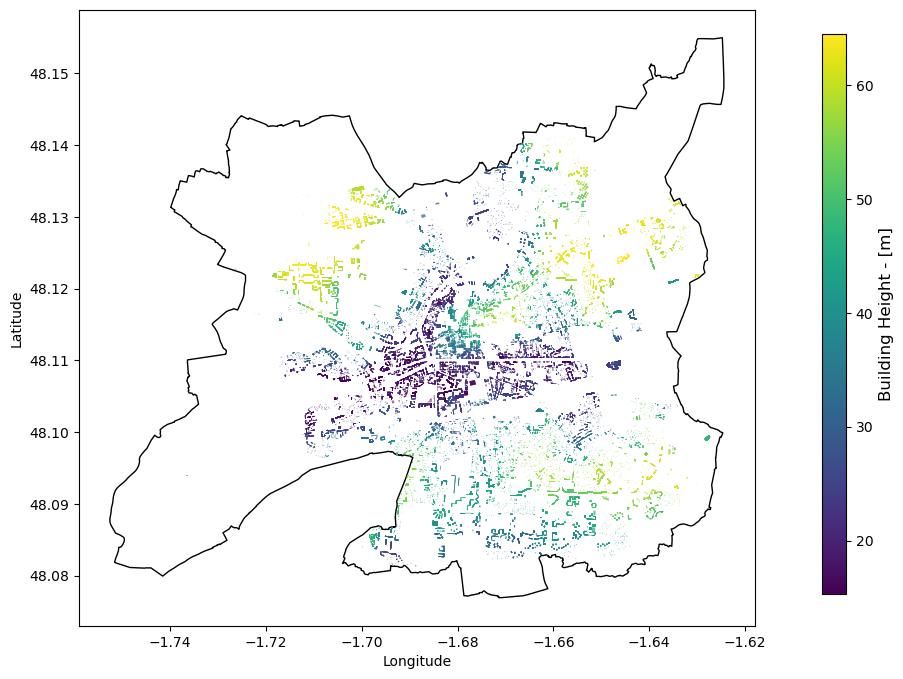

In [13]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

# Step 1: Extract administrative boundary of Rennes from OpenStreetMap
city_name = "Rennes, France"
print("Downloading administrative boundary for Rennes...")
rennes_boundary = ox.geocode_to_gdf(city_name)

# Step 2: Ensure final_df is a GeoDataFrame and clip data to Rennes boundary
# Assuming final_df is already loaded and contains a column 'zmin' with building heights
if 'geometry' not in final_df.columns:
    raise ValueError("final_df must contain a 'geometry' column with building locations.")

# Convert final_df to GeoDataFrame (if not already)
final_gdf = gpd.GeoDataFrame(final_df, geometry='geometry', crs=rennes_boundary.crs)

# Clip the data to Rennes boundary
print("Clipping data to Rennes boundary...")
final_gdf = gpd.clip(final_gdf, rennes_boundary)

# Step 3: Plot building heights within Rennes
fig, ax = plt.subplots(figsize=(12, 8))
rennes_boundary.plot(ax=ax, facecolor="none", edgecolor="black", linewidth=1, label="Rennes Boundary")

# Plot buildings colored by 'zmin' (building heights)
norm = Normalize(vmin=final_gdf['zmin'].min(), vmax=final_gdf['zmin'].max())
scatter = final_gdf.plot(
    ax=ax,
    column='zmin',
    cmap='viridis',
    legend=False,  # Disable the default legend
    alpha=0.7,
    markersize=2
)

# Add a colorbar for 'zmin'
cbar_ax = fig.add_axes([0.85, 0.15, 0.02, 0.7])  # Position for the colorbar
cbar = ColorbarBase(cbar_ax, cmap='viridis', norm=norm)
cbar.set_label('Building Height - [m]', fontsize=12)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()


/tmp/ipykernel_98/3218995987.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_rennes['building_cluster_label'] = filtered_rennes['bygg_type_v2'].map(cluster_labels)


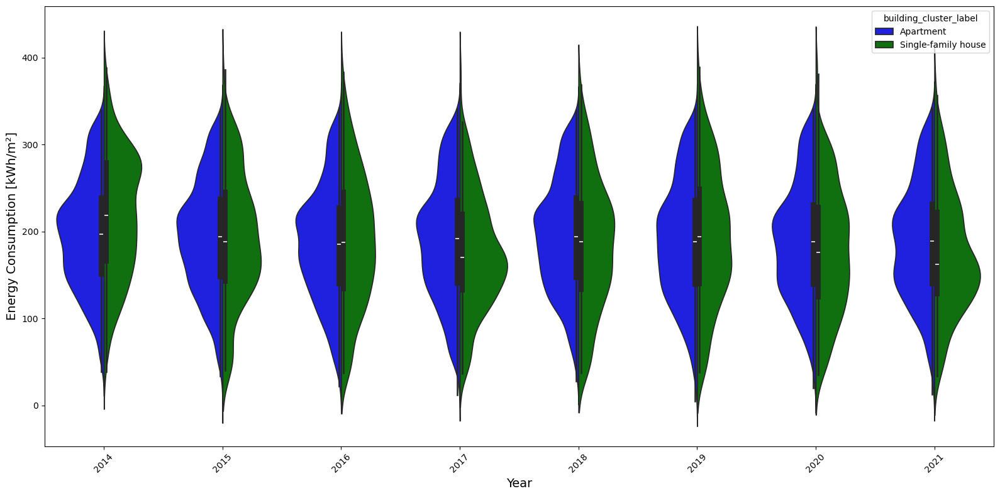

In [127]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

final_df = gpd.read_file(r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall.sqlite')

# Filter out energy values above 600
filtered_rennes = final_df[(final_df['consommation_energie'] <= 600) & 
                           (final_df['year'] > 2013) &
                           (final_df['consommation_energie'] > 0)]

# Map building cluster labels to more descriptive names
cluster_labels = {
    "AB": "Apartment",
    "SFH": "Single-family house"
}

# Add a column for labeled building clusters
filtered_rennes['building_cluster_label'] = filtered_rennes['bygg_type_v2'].map(cluster_labels)

# Create a violin plot
fig, ax = plt.subplots(figsize=(16, 8))  # Increase figure width for wider gaps
sns.violinplot(
    data=filtered_rennes,
    x='year',
    y='consommation_energie',
    hue='building_cluster_label',
    split=True,
    palette={"Apartment": "blue", "Single-family house": "green", "Multi-family house": "orange"},
    ax=ax
)

# Set plot title and labels
# ax.set_title('Energy Consumption Distribution by Building Type Over Years', fontsize=16)
ax.set_xlabel('Year', fontsize=14)
ax.set_ylabel('Energy Consumption [kWh/m²]', fontsize=14)

# Add room between years on x-axis
unique_years = sorted(filtered_rennes['year'].unique())
ax.set_xticks(range(len(unique_years)))
ax.set_xticklabels(unique_years, fontsize=10, rotation=45)
ax.set_xlim(-0.5, len(unique_years) - 0.5)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [85]:
renovated['nom_methode_dpe'].unique()

array(['3CL - DPE', 'Méthode 3CL', 'Méthode Facture', 'FACTURE - DPE',
       'TH_C_E', 'TROIS_CL_DPE', 'FACTURE', '3CL', 'Factures', 'th-CE',
       'FACTURE SEULE', 'Th-BCE', 'DPE VIERGE', '3CL-DPE', 'Th-C-E',
       'TH_BCE', 'DPE 3 cl'], dtype=object)

In [34]:
renovated.columns

Index(['id_bati3d', 'jannat', 'zmin', 'zmax', 'niveau', 'nb_logement',
       'nb_maison', 'nb_appart', 'nb_loc_comm', 'nb_dep', 'surf_locaux',
       'surf_locaux_hab', 'surf_locaux_dep_hab', 'surf_locaux_dep',
       'surf_locaux_pro', 'nb_bati_majic', 'shape', 'neighbors', 'wall_length',
       'wall_height', 'shared_wall', 'nom_methode_dpe', 'version_methode_dpe',
       'date_etablissement_dpe', 'consommation_energie',
       'classe_consommation_energie', 'estimation_ges',
       'classe_estimation_ges', 'annee_construction', 'surface_thermique_lot',
       'tr001_modele_dpe_type_libelle', 'tr002_type_batiment_description',
       'code_insee_commune_actualise', 'tv016_departement_code', 'geo_adresse',
       'geo_score', 'qh_(kwh/m2a)_1_12011', 'qh_(kwh/m2a)_1_12012',
       'qh_(kwh/m2a)_1_12013', 'qh_(kwh/m2a)_1_12014', 'qh_(kwh/m2a)_1_12015',
       'qh_(kwh/m2a)_1_12016', 'qh_(kwh/m2a)_1_12017', 'qh_(kwh/m2a)_1_12018',
       'qh_(kwh/m2a)_1_12019', 'qh_(kwh/m2a)_1_12020', '

In [10]:
from scipy.optimize import minimize
import numpy as np
import pandas as pd
import geopandas as gpd
import os
idx = pd.IndexSlice

def QH_calc_optimized(VV, year, BRA, WR):

    # A dictionary with the specified keys and values for covered buildings in Rennes
    building_types = {
        "AB": "TR002_002",
        "SFH": "TR002_001"
    }

    upath = r'/home/babakebrahimi/s3/data'
    
    # Extracting parts of TABULA spreadsheet
    buil_set = pd.read_excel(os.path.join(upath, 'tabula-episcope', 'subset_TABULA.xlsx'))
    sys_set = pd.read_excel(os.path.join(upath, 'tabula-episcope', 'TABULA_sys_set_FR.xlsx'))
    
    # Removing rows that don't represent a country 
    buil_set = buil_set[buil_set['Code_Country'].notna()]
    buil_set = buil_set[buil_set['Description_BuildingVariant'].notna()]
    buil_set = buil_set[buil_set['Code_Country'] != 'XX']

    # Creating a multiindex
    buil_set.set_index(['Code_Country', 'Code_DataType_Building', 'Name_ClimateRegion', 
                        'Description_BuildingVariant', 'Code_BuildingSizeClass', 
                        'Year1_Building', 'Year2_Building'], inplace=True)

    buil_set = buil_set.sort_index(level=[0, 1, 2, 3, 4])

    # Creating a multiindex for system set
    sys_set.set_index(['Code_BuildingVariant'], inplace=True)
    sys_set = sys_set.sort_index(level=[0])

    read_file = r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall_v2.sqlite'
    # Reading the generated shapefile containing building info   
    bolig = gpd.read_file(read_file).to_crs('EPSG:3857').reset_index(drop=True)
    
    # Convert 'jannat' column to numeric, forcing errors to NaN
    bolig['jannat'] = pd.to_numeric(bolig['jannat'], errors='coerce')  # Converts non-numeric values to NaN

    # Define constants
    CO = 'FR'
    Typo = 'ReEx'
    Cl = 'National'
    COND_dic = {
        1: ['Existing state of the buidling'],
        2: ['Complead refurbishment, standard solutions'],
        3: ['Complead refurbishment, advanced solutions']
    }

    bolig['year'] = bolig['date_etablissement_dpe'].str.split('-').str[0].astype(int)

    # Filter buildings for the specified year
    bolig_filtered = bolig[(bolig['year'] == year) & (bolig['consommation_energie'] > 0) & (bolig['nom_methode_dpe'].isin(['Méthode 3CL'])) & (bolig['jannat'] < 2000)].copy()

    
    # Randomly select 10% of the data (if not empty)
    if not bolig_filtered.empty:
        bolig_filtered = bolig_filtered.sample(frac=0.1, random_state=42)  # 10% sample

    if bolig_filtered.empty:
        print(f"No valid buildings found for year {year}.")
        return [], []
                    
    QH_values = []
    ene_cons = []
        
    # Looping through building energy performance levels
    for c in [2]:
                            
        for index, row in bolig_filtered.iterrows():
            
                
            for i, j in building_types.items():
                if row['tr002_type_batiment_code'] in j:
                    B_type = i
                    break
           
            Y = row['jannat']
            if pd.isna(Y):  # Skip if 'jannat' is NaN
                continue
            
            # Creating a multiindex element
            i = None
            for a in buil_set.loc[(CO, Typo, Cl, COND_dic[c], B_type)].index:
                if a[-2] <= Y <= a[-1]:
                    y0, y1 = a[-2], a[-1]
                    i = (CO, Typo, Cl, COND_dic[c], B_type, y0, y1)
                    break
            
            if i is None:
                continue  # Skip if no matching index found
            
            try:
                if 0 <= Y <= 1914:
                    sys_i = f"{CO}.N.{B_type}.01.Gen.{Typo}.001.00{c}"
                elif 1915 <= Y <= 1948:
                    sys_i = f"{CO}.N.{B_type}.02.Gen.{Typo}.001.00{c}"
                elif 1949 <= Y <= 1967:
                    sys_i = f"{CO}.N.{B_type}.03.Gen.{Typo}.001.00{c}"
                elif 1968 <= Y <= 1974:
                    sys_i = f"{CO}.N.{B_type}.04.Gen.{Typo}.001.00{c}"
                elif 1975 <= Y <= 1981:
                    sys_i = f"{CO}.N.{B_type}.05.Gen.{Typo}.001.00{c}"
                elif 1982 <= Y <= 1989:
                    sys_i = f"{CO}.N.{B_type}.06.Gen.{Typo}.001.00{c}"
                elif 1990 <= Y <= 1999:
                    sys_i = f"{CO}.N.{B_type}.07.Gen.{Typo}.001.00{c}"
                elif 2000 <= Y <= 2005:
                    sys_i = f"{CO}.N.{B_type}.08.Gen.{Typo}.001.00{c}"
                elif 2006 <= Y <= 2012:
                    sys_i = f"{CO}.N.{B_type}.09.Gen.{Typo}.001.00{c}"
                elif 2013 <= Y <= 9999:
                    sys_i = f"{CO}.N.{B_type}.10.Gen.{Typo}.001.00{c}"
                else:
                    raise ValueError("Unexpected value of Y:", Y)
            except Exception as e:
                print("Error:", e)
                continue  # Skip to next iteration

            # Estimated air-conditioned area
            A_C_est = BRA * row['geometry'].area

            # Estimated areas
            A_roof_est = BRA * row['geometry'].area
            A_floor_est = BRA * row['geometry'].area
            A_wall_est = WR * ((row.geometry.length * float(row['zmin']) - row['shared_wall']) * (1 - 0.13))
            A_window_est = WR * ((row.geometry.length * float(row['zmin']) - row['shared_wall']) * 0.13)
            A_door_est = 0
        

            # Heat transfer coefficients
            Htr_roof = buil_set.loc[idx[i], 'U_Roof_1'].values * A_roof_est * buil_set.loc[idx[i], 'b_Transmission_Roof_1'].values
            Htr_floor = buil_set.loc[idx[i], 'U_Floor_1'].values * A_floor_est * buil_set.loc[idx[i], 'b_Transmission_Floor_1'].values
            Htr_wall = buil_set.loc[idx[i], 'U_Wall_1'].values * A_wall_est * buil_set.loc[idx[i], 'b_Transmission_Wall_1'].values
            Htr_window = buil_set.loc[idx[i], 'U_Window_1'].values * A_window_est
            Htr_door = buil_set.loc[idx[i], 'U_Door_1'].values * A_door_est
            Htr_tb = buil_set.loc[idx[i], 'delta_U_ThermalBridging_Original'].values * (A_roof_est + A_floor_est + A_wall_est + A_window_est + A_door_est)

            Htr = Htr_roof + Htr_floor + Htr_wall + Htr_window + Htr_door + Htr_tb

            # Heat transfer by ventilation
            Cp_air = 0.34
            Hve = Cp_air * (buil_set.loc[idx[i], 'n_air_use'].values + buil_set.loc[idx[i], 'n_air_infiltration'].values) * A_C_est * buil_set.loc[idx[i], 'h_room'].values

            # Internal temperature
            if buil_set.loc[idx[i],'theta_i'].values >= 0:
                int_tmp = buil_set.loc[idx[i], 'theta_i']
            else:
                int_tmp = buil_set.loc[idx[i], 'theta_i_htr1'].values + (Htr - 1) / 3 * (buil_set.loc[idx[i], 'theta_i_htr4'].values - buil_set.loc[idx[i], 'theta_i_htr1'].values)

            tmp = (int_tmp - buil_set.loc[idx[i], 'Theta_e'].values) * VV

            # Temperature reduction factor
            if Htr / A_C_est <= 1:
                Fred = min(buil_set.loc[idx[i], 'F_red_htr1'].values + (1 - 597 / 159.4) / 0.5 * (1 - buil_set.loc[idx[i], 'F_red_htr1'].values), 1)
            elif Htr / A_C_est >= 4:
                Fred = buil_set.loc[idx[i], 'F_red_htr4']
            else:
                Fred = buil_set.loc[idx[i], 'F_red_htr1'].values + (Htr / A_C_est - 1) * (buil_set.loc[idx[i], 'F_red_htr4'].values - buil_set.loc[idx[i], 'F_red_htr1'].values) / 3

            Qht = (Htr + Hve) * Fred * (tmp * 0.024)

            # Solar heat load
            Qsol = 0
            for w in ['Hor', 'East', 'South', 'West', 'North']:
                if w == 'Hor':
                    Qsol += buil_set.loc[idx[i], 'F_sh_hor'].values * (1 - buil_set.loc[idx[i], 'F_f'].values) * buil_set.loc[idx[i], 'F_w'].values * buil_set.loc[idx[i], 'g_gl_n_Window_1'].values * 0 * buil_set.loc[idx[i], f'I_Sol_{w}'].values
                else:
                    Qsol += buil_set.loc[idx[i], 'F_sh_vert'].values * (1 - buil_set.loc[idx[i], 'F_f'].values) * buil_set.loc[idx[i], 'F_w'].values * buil_set.loc[idx[i], 'g_gl_n_Window_1'].values * (A_window_est * 0.25) * buil_set.loc[idx[i], f'I_Sol_{w}'].values

            # Internal heat source
            Qint = 0.024 * buil_set.loc[idx[i], 'phi_int'].values * VV * A_C_est

            # Constant parameter aH
            aH = 0.8 + ((buil_set.loc[idx[i], 'c_m'].values * A_C_est / (Htr + Hve)) / 30)

            # Heat balance ratio
            lamd = (Qsol + Qint) / Qht

            # Gain utilization factor for heating
            mu = (1 - lamd ** aH) / (1 - lamd ** (aH + 1))

            # Energy needed for heating
            QH = Qht - mu * (Qsol + Qint)
            
            # Ensure QH is a scalar
            if isinstance(QH, pd.Series):
                QH = QH.iloc[0]  # Take first value if Series
            elif isinstance(QH, np.ndarray):
                QH = QH[0]  # Take first value if array
            
            # Validate QH value
            if QH is None or np.isnan(QH) or QH < 0:
                continue  # Skip invalid results
                
            if np.isnan(QH).any():
                print(f"Invalid QH {QH} for index {index}.")

            # Skip row if either value is NaN
            if pd.isna(row['consommation_energie_finale_1.0']) or pd.isna(row['surface_thermique_lot']):
                continue
            
            # Ensure QH is a valid numeric value
            if isinstance(QH, (list, np.ndarray, pd.Series)):  
                QH_values.append(QH[0] / A_C_est)  # Take first element if iterable
            else:
                QH_values.append(QH / A_C_est)  # Use directly if scalar
            
            if isinstance(QH, (np.ndarray, pd.Series)) and np.isnan(QH).any():
                print(f"Invalid QH {QH} for index {index}.")
            elif np.isnan(QH):
                print(f"Invalid QH {QH} for index {index}.")
            
            # making sure that the observed_y represent only half of the consumed energy since in accordance with French OpenGov. 
            # only half of the consumed energy is corresponding to the domestic heating and hot water demand. 
            
            # Handle 'consommation_energie_finale_2.0' (use 0 if NaN)
            conso_2 = row['consommation_energie_finale_2.0'] if pd.notna(row['consommation_energie_finale_2.0']) else 0
            
            # Append valid energy consumption calculation
            ene_cons.append((row['consommation_energie_finale_1.0'] + conso_2) / row['surface_thermique_lot'])
    
    # Ensure both lists have the same length before returning
    min_length = min(len(QH_values), len(ene_cons))
    QH_values = QH_values[:min_length]
    ene_cons = ene_cons[:min_length]

    return QH_values, ene_cons

def mse(VV, year, BRA, WR):
    """
    Mean Squared Error function for optimization.
    """
    QH_values, observed_y = QH_calc_optimized(VV, year, BRA, WR)

    # Convert observed_y to a NumPy array
    observed_y = np.array(observed_y, dtype=np.float64)

    # Validate QH_calc_optimized Output
    if QH_values is None or len(QH_values) == 0 or np.isnan(QH_values).any():
        print(f"Invalid QH_values for year {year} and VV {VV}. Applying penalty.")
        return 1e6  # Large penalty for invalid results
    if observed_y is None or len(observed_y) == 0 or np.isnan(observed_y).any():
        print(f"Invalid observed_y for year {year}. Applying penalty.")
        return 1e6  # Large penalty for missing observed data

    # Check alignment between QH_values and observed_y
    if len(QH_values) != len(observed_y):
        print(f"Mismatch in data lengths for year {year}: QH_values ({len(QH_values)}) vs observed_y ({len(observed_y)}).")
        return 1e6  # Large penalty for mismatched lengths

    # Compute MSE
    return np.mean((np.array(QH_values) - observed_y) ** 2)

def optimize_VV_per_years(years):
    """
    Optimizes VV, BRA, and WR for each year to minimize MSE.
    """
    optimal_values = {}

    for year in years:
        print(f"Optimizing for year: {year}")

        # Define the MSE function to minimize for the specific year
        def mse_for_year(params):
            VV, BRA, WR = params  # Unpack parameters
            return mse(VV, year, BRA, WR) # Ensure mse is defined

        # Initial guesses for VV and ratio
        initial_guess = [100.0, 1, 1]  # VV=100.0, BRA=1, WR=1
        bounds = [(1, 300), (0.6, 1), (0.6, 1)]  # Bounds for VV, BRA, WR

        # Perform optimization for the current year
        result = minimize(mse_for_year,
                          x0=initial_guess,  # Initial guesses for VV, BRA, WR
                          bounds=bounds,     # Bounds for parameters
                          method="L-BFGS-B"  # Bounded optimization method
                         )

        # Check if optimization was successful
        if result.success:
            optimal_values[year] = (result.x[0], result.x[1], result.x[2])
            print(f"Year: {year}, Optimal VV: {result.x[0]}, Optimal BRA: {result.x[1]}, Optimal WR: {result.x[2]}, MSE: {result.fun}")
        else:
            print(f"Optimization failed for year {year}. Reason: {result.message}")

    return optimal_values
    
# Run the optimization
years_to_optimize = list(range(2020, 2021))
optimal_VV_results = optimize_VV_per_years(years_to_optimize)

# Store results in a DataFrame
results_df = pd.DataFrame(
    {
        "Year": list(optimal_VV_results.keys()),
        "Optimal VV": [v[0] if v else np.nan for v in optimal_VV_results.values()],
        "Optimal BRA": [v[1] if v else np.nan for v in optimal_VV_results.values()],
        "Optimal WR": [v[2] if v else np.nan for v in optimal_VV_results.values()]
    }
)

# Output the DataFrame
print("Optimal VV, BRA, WR values per year:")
print(results_df)

# Save to a CSV file for future reference
results_df.to_csv("/home/babakebrahimi/s3/data/Rennes_optimal_VV_BRA_WR_results.csv", index=False)

Optimizing for year: 2020
Year: 2020, Optimal VV: 68.2047513952542, Optimal BRA: 1.0, Optimal WR: 0.6, MSE: 6773.316859672423
Optimal VV, BRA, WR values per year:
   Year  Optimal VV  Optimal BRA  Optimal WR
0  2020   68.204751          1.0         0.6


In [7]:
read_file = r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall_v2.sqlite'
    # Reading the generated shapefile containing building info   
bolig = gpd.read_file(read_file).to_crs('EPSG:3857').reset_index(drop=True)

In [6]:
def QH_calc(write_file):

    # A dictionary with the specified keys and values for covered buildings in Rennes
    building_types = {
        "AB": "TR002_002",
        "SFH": "TR002_001"
    }

    upath = r'/home/babakebrahimi/s3/data'
    
    # Extracting parts of TABULA spreadsheet
    buil_set = pd.read_excel(os.path.join(upath, 'tabula-episcope', 'subset_TABULA.xlsx'))
    sys_set = pd.read_excel(os.path.join(upath, 'tabula-episcope', 'TABULA_sys_set_FR.xlsx'))
    
    # Removing rows that don't represent a country 
    buil_set = buil_set[buil_set['Code_Country'].notna()]
    buil_set = buil_set[buil_set['Description_BuildingVariant'].notna()]
    buil_set = buil_set[buil_set['Code_Country'] != 'XX']

    # Creating a multiindex
    buil_set.set_index(['Code_Country', 'Code_DataType_Building', 'Name_ClimateRegion', 
                        'Description_BuildingVariant', 'Code_BuildingSizeClass', 
                        'Year1_Building', 'Year2_Building'], inplace=True)

    buil_set = buil_set.sort_index(level=[0, 1, 2, 3, 4])

    # Creating a multiindex for system set
    sys_set.set_index(['Code_BuildingVariant'], inplace=True)
    sys_set = sys_set.sort_index(level=[0])

    read_file = r'/home/babakebrahimi/s3/data/France/rennes_building_shared-wall_v2.sqlite'
    # Reading the generated shapefile containing building info   
    bolig = gpd.read_file(read_file).to_crs('EPSG:3857').reset_index(drop=True)
    
    # Convert 'jannat' column to numeric, forcing errors to NaN
    bolig['jannat'] = pd.to_numeric(bolig['jannat'], errors='coerce')  # Converts non-numeric values to NaN

    # Define constants
    CO = 'FR'
    Typo = 'ReEx'
    Cl = 'National'
    COND_dic = {
        1: ['Existing state of the buidling'],
        2: ['Complead refurbishment, standard solutions'],
        3: ['Complead refurbishment, advanced solutions']
    }

    opt = pd.read_csv(r'/home/babakebrahimi/s3/data/optimization/Rennes_optimal_VV_BRA_WR_results.csv')

    YY = opt['Year']

    bolig['year'] = bolig['date_etablissement_dpe'].str.split('-').str[0].astype(int)

    # Filter buildings for the specified year
    bolig_filtered = bolig[(bolig['year'] == opt['Year'][0]) & (bolig['consommation_energie'] > 0) & (bolig['nom_methode_dpe'].isin(['Méthode 3CL']))].copy()

    
    # Randomly select 10% of the data (if not empty)
    if not bolig_filtered.empty:
        bolig_filtered = bolig_filtered.sample(frac=1, random_state=42)  # 10% sample

    if bolig_filtered.empty:
        print(f"No valid buildings found for year {year}.")
        return [], []
                    
    QH_values = []
    ene_cons = []
        
    # Looping through building energy performance levels
    for c in [1,2]:
                            
        for index, row in bolig_filtered.iterrows():

            # Ensure 'År' meets the condition based on c
            if (c == 1 and row['jannat'] < 2000) or (c == 2 and row['jannat'] >= 2000):
                continue  # Skip this row if it doesn't meet the condition
            
                
            for i, j in building_types.items():
                if row['tr002_type_batiment_code'] in j:
                    B_type = i
                    break
           
            Y = row['jannat']
            if pd.isna(Y):  # Skip if 'jannat' is NaN
                continue
            
            # Creating a multiindex element
            i = None
            for a in buil_set.loc[(CO, Typo, Cl, COND_dic[c], B_type)].index:
                if a[-2] <= Y <= a[-1]:
                    y0, y1 = a[-2], a[-1]
                    i = (CO, Typo, Cl, COND_dic[c], B_type, y0, y1)
                    break
            
            if i is None:
                continue  # Skip if no matching index found
            
            try:
                if 0 <= Y <= 1914:
                    sys_i = f"{CO}.N.{B_type}.01.Gen.{Typo}.001.00{c}"
                elif 1915 <= Y <= 1948:
                    sys_i = f"{CO}.N.{B_type}.02.Gen.{Typo}.001.00{c}"
                elif 1949 <= Y <= 1967:
                    sys_i = f"{CO}.N.{B_type}.03.Gen.{Typo}.001.00{c}"
                elif 1968 <= Y <= 1974:
                    sys_i = f"{CO}.N.{B_type}.04.Gen.{Typo}.001.00{c}"
                elif 1975 <= Y <= 1981:
                    sys_i = f"{CO}.N.{B_type}.05.Gen.{Typo}.001.00{c}"
                elif 1982 <= Y <= 1989:
                    sys_i = f"{CO}.N.{B_type}.06.Gen.{Typo}.001.00{c}"
                elif 1990 <= Y <= 1999:
                    sys_i = f"{CO}.N.{B_type}.07.Gen.{Typo}.001.00{c}"
                elif 2000 <= Y <= 2005:
                    sys_i = f"{CO}.N.{B_type}.08.Gen.{Typo}.001.00{c}"
                elif 2006 <= Y <= 2012:
                    sys_i = f"{CO}.N.{B_type}.09.Gen.{Typo}.001.00{c}"
                elif 2013 <= Y <= 9999:
                    sys_i = f"{CO}.N.{B_type}.10.Gen.{Typo}.001.00{c}"
                else:
                    raise ValueError("Unexpected value of Y:", Y)
            except Exception as e:
                print("Error:", e)
                continue  # Skip to next iteration

            # Estimated air-conditioned area
            A_C_est = opt['Optimal BRA'][0] * row['geometry'].area

            # Estimated areas
            A_roof_est = opt['Optimal BRA'][0] * row['geometry'].area
            A_floor_est = opt['Optimal BRA'][0] * row['geometry'].area
            A_wall_est = opt['Optimal WR'][0] * ((row.geometry.length * float(row['zmin']) - row['shared_wall']) * (1 - 0.13))
            A_window_est = opt['Optimal WR'][0] * ((row.geometry.length * float(row['zmin']) - row['shared_wall']) * 0.13)
            A_door_est = 0
        

            # Heat transfer coefficients
            Htr_roof = buil_set.loc[idx[i], 'U_Roof_1'].values * A_roof_est * buil_set.loc[idx[i], 'b_Transmission_Roof_1'].values
            Htr_floor = buil_set.loc[idx[i], 'U_Floor_1'].values * A_floor_est * buil_set.loc[idx[i], 'b_Transmission_Floor_1'].values
            Htr_wall = buil_set.loc[idx[i], 'U_Wall_1'].values * A_wall_est * buil_set.loc[idx[i], 'b_Transmission_Wall_1'].values
            Htr_window = buil_set.loc[idx[i], 'U_Window_1'].values * A_window_est
            Htr_door = buil_set.loc[idx[i], 'U_Door_1'].values * A_door_est
            Htr_tb = buil_set.loc[idx[i], 'delta_U_ThermalBridging_Original'].values * (A_roof_est + A_floor_est + A_wall_est + A_window_est + A_door_est)

            Htr = Htr_roof + Htr_floor + Htr_wall + Htr_window + Htr_door + Htr_tb

            # Heat transfer by ventilation
            Cp_air = 0.34
            Hve = Cp_air * (buil_set.loc[idx[i], 'n_air_use'].values + buil_set.loc[idx[i], 'n_air_infiltration'].values) * A_C_est * buil_set.loc[idx[i], 'h_room'].values

            # Internal temperature
            if buil_set.loc[idx[i],'theta_i'].values >= 0:
                int_tmp = buil_set.loc[idx[i], 'theta_i']
            else:
                int_tmp = buil_set.loc[idx[i], 'theta_i_htr1'].values + (Htr - 1) / 3 * (buil_set.loc[idx[i], 'theta_i_htr4'].values - buil_set.loc[idx[i], 'theta_i_htr1'].values)

            tmp = (int_tmp - buil_set.loc[idx[i], 'Theta_e'].values) * opt['Optimal VV'][0]

            # Temperature reduction factor
            if Htr / A_C_est <= 1:
                Fred = min(buil_set.loc[idx[i], 'F_red_htr1'].values + (1 - 597 / 159.4) / 0.5 * (1 - buil_set.loc[idx[i], 'F_red_htr1'].values), 1)
            elif Htr / A_C_est >= 4:
                Fred = buil_set.loc[idx[i], 'F_red_htr4']
            else:
                Fred = buil_set.loc[idx[i], 'F_red_htr1'].values + (Htr / A_C_est - 1) * (buil_set.loc[idx[i], 'F_red_htr4'].values - buil_set.loc[idx[i], 'F_red_htr1'].values) / 3

            Qht = (Htr + Hve) * Fred * (tmp * 0.024)

            # Solar heat load
            Qsol = 0
            for w in ['Hor', 'East', 'South', 'West', 'North']:
                if w == 'Hor':
                    Qsol += buil_set.loc[idx[i], 'F_sh_hor'].values * (1 - buil_set.loc[idx[i], 'F_f'].values) * buil_set.loc[idx[i], 'F_w'].values * buil_set.loc[idx[i], 'g_gl_n_Window_1'].values * 0 * buil_set.loc[idx[i], f'I_Sol_{w}'].values
                else:
                    Qsol += buil_set.loc[idx[i], 'F_sh_vert'].values * (1 - buil_set.loc[idx[i], 'F_f'].values) * buil_set.loc[idx[i], 'F_w'].values * buil_set.loc[idx[i], 'g_gl_n_Window_1'].values * (A_window_est * 0.25) * buil_set.loc[idx[i], f'I_Sol_{w}'].values

            # Internal heat source
            Qint = 0.024 * buil_set.loc[idx[i], 'phi_int'].values * opt['Optimal VV'][0] * A_C_est

            # Constant parameter aH
            aH = 0.8 + ((buil_set.loc[idx[i], 'c_m'].values * A_C_est / (Htr + Hve)) / 30)

            # Heat balance ratio
            lamd = (Qsol + Qint) / Qht

            # Gain utilization factor for heating
            mu = (1 - lamd ** aH) / (1 - lamd ** (aH + 1))

            # Energy needed for heating
            QH = Qht - mu * (Qsol + Qint)
            
            bolig_filtered.at[index, f'QH_(kWh/m2a)_OPT_2020'] = QH.iloc[0] / A_C_est

    return bolig_filtered.to_csv(write_file)

In [7]:
QH_calc(r'/home/babakebrahimi/s3/data/Oslo/Rennes_optimized_2020_renovated.csv')

In [17]:
final_df = pd.read_csv(r'/home/babakebrahimi/s3/data/Oslo/Rennes_optimized_2020_renovated.csv')

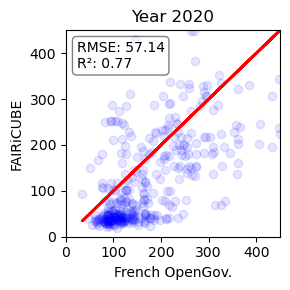

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score

# Function to calculate and display RMSE and R² for 2D data
def calculate_and_display_metrics(ax, true_x, true_y, pred_x, pred_y):
    true_distances = np.sqrt(true_x**2 + true_y**2)
    pred_distances = np.sqrt(pred_x**2 + pred_y**2)

    mse = mean_squared_error(true_distances, pred_distances)
    rmse = np.sqrt(mse)
    r2 = r2_score(true_distances, pred_distances)

    ax.text(0.05, 0.95, f'RMSE: {rmse:.2f}\nR²: {r2:.2f}', transform=ax.transAxes, 
            fontsize=10, verticalalignment='top', bbox=dict(boxstyle="round", facecolor="white", alpha=0.5))
    return rmse, r2

# Define the specific year to plot
year_to_plot = 2020
column_name = f'QH_(kWh/m2a)_OPT_{year_to_plot}'

# Check if the column exists in the dataset
if column_name in final_df.columns:
    # Filter data for the selected year
    data = final_df[(final_df['year'].astype(int) == year_to_plot) & 
                    (final_df[column_name] < 600)].copy()

    # Ensure 'consommation_energie_finale_2.0' has no NaN values
    data['consommation_energie_finale_2.0'] = data['consommation_energie_finale_2.0'].fillna(0)

    # Compute energy consumption correctly
    data['energy_consumption'] = (data['consommation_energie_finale_1.0'] + data['consommation_energie_finale_2.0']) / data['surface_thermique_lot']

    # Ensure non-empty dataset
    if not data.empty:
        true_x = data['energy_consumption']
        true_y = data['energy_consumption']
        pred_x = data['energy_consumption']
        pred_y = data[column_name]

        # Create the plot
        fig, ax = plt.subplots(figsize=(3, 3))
        ax.scatter(true_x, pred_y, color='blue', marker='o', alpha=0.1)
        ax.plot(true_x, true_x, color='red', linestyle='-', linewidth=2)  # Diagonal reference line
        ax.set_title(f'Year {year_to_plot}')
        ax.set_xlabel('French OpenGov.')
        ax.set_ylabel('FAIRiCUBE')

        # Ensure identical x- and y-axis scales
        max_limit = max(true_x.max(), pred_y.max())
        ax.set_xlim(0, max_limit)
        ax.set_ylim(0, max_limit)

        # Calculate and display metrics
        calculate_and_display_metrics(ax, true_x, true_y, pred_x, pred_y)

        plt.tight_layout()
        plt.savefig("rennes_opt_energy_use_esimate.png", dpi=300)
        plt.show()


In [19]:
final_df = pd.read_csv(r'/home/babakebrahimi/s3/data/France/plot_rennes.csv')

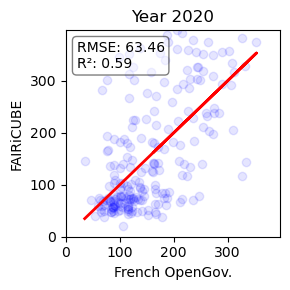

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score

# Function to calculate and display RMSE and R² for 2D data
def calculate_and_display_metrics(ax, true_x, true_y, pred_x, pred_y):
    true_distances = np.sqrt(true_x**2 + true_y**2)
    pred_distances = np.sqrt(pred_x**2 + pred_y**2)

    mse = mean_squared_error(true_distances, pred_distances)
    rmse = np.sqrt(mse)
    r2 = r2_score(true_distances, pred_distances)

    ax.text(0.05, 0.95, f'RMSE: {rmse:.2f}\nR²: {r2:.2f}', transform=ax.transAxes, 
            fontsize=10, verticalalignment='top', bbox=dict(boxstyle="round", facecolor="white", alpha=0.5))
    return rmse, r2

# Define the specific year to plot
year_to_plot = 2020
column_name = f'qh_(kwh/m2a)_1_0.8{year_to_plot}'

# Check if the column exists in the dataset
if column_name in final_df.columns:
    # Filter data for the selected year
    data = final_df[(final_df['year'].astype(int) == year_to_plot) & 
                    (final_df[column_name] < 400) &
                    ((final_df['consommation_energie_finale_1.0_kWh/m2'] + final_df['consommation_energie_finale_2.0_kWh/m2']) < 400) &
                    (final_df['consommation_energie'] > 0) & 
                    (final_df['nom_methode_dpe'].isin(['Méthode 3CL']))].copy()

    # Ensure no missing values in key columns
    data = data[['consommation_energie_finale_1.0_kWh/m2', 'consommation_energie_finale_2.0_kWh/m2', column_name]].dropna()
        

    # Ensure non-empty dataset
    if not data.empty:
        # Define true and predicted values correctly
        true_x = data['consommation_energie_finale_1.0_kWh/m2'] + data['consommation_energie_finale_2.0_kWh/m2'] 
        true_y = data['consommation_energie_finale_1.0_kWh/m2'] + data['consommation_energie_finale_2.0_kWh/m2']
        
        pred_x = data['consommation_energie_finale_1.0_kWh/m2'] + data['consommation_energie_finale_2.0_kWh/m2']
        pred_y = data[column_name]

        # Create the plot
        fig, ax = plt.subplots(figsize=(3, 3))
        ax.scatter(true_x, pred_y, color='blue', marker='o', alpha=0.1)
        ax.plot(true_x, true_x, color='red', linestyle='-', linewidth=2)  # Diagonal reference line
        ax.set_title(f'Year {year_to_plot}')
        ax.set_xlabel('French OpenGov.')
        ax.set_ylabel('FAIRiCUBE')

        # Ensure identical x- and y-axis scales
        max_limit = max(true_x.max(), pred_y.max())
        ax.set_xlim(0, max_limit)
        ax.set_ylim(0, max_limit)

        # Calculate and display metrics
        calculate_and_display_metrics(ax, true_x, true_y, pred_x, pred_y)

        plt.tight_layout()
        plt.savefig("rennes_original_energy_use_esimate.png", dpi=300)
        plt.show()

In [20]:
final_df

,Unnamed: 0,id_bati3d,zmin,year,bygg_type_v2,cohort,tr002_type_batiment_description,annee_construction,nom_methode_dpe,consommation_energie,qh_(kwh/m2a)_1_0.82014,qh_(kwh/m2a)_1_0.82015,qh_(kwh/m2a)_1_0.82016,qh_(kwh/m2a)_1_0.82017,qh_(kwh/m2a)_1_0.82018,qh_(kwh/m2a)_1_0.82019,qh_(kwh/m2a)_1_0.82020,consommation_energie_finale_1.0_kWh/m2,consommation_energie_finale_2.0_kWh/m2,consommation_energie_finale_11.0_kWh/m2
0,0,35238_008657,43.039,2016,AB,1975_1981,Logement,1981.0,TROIS_CL_DPE,190.64,NaN,NaN,127.279922,NaN,NaN,NaN,NaN,146.906996,43.741594,NaN
1,1,35238_008657,43.039,2019,AB,1975_1981,Logement,1978.0,Méthode 3CL,130.00,NaN,NaN,NaN,NaN,NaN,127.279922,NaN,117.931616,27.473636,NaN
2,2,35238_008660,39.509,2018,AB,1975_1981,Logement,1978.0,Méthode 3CL,143.00,NaN,NaN,NaN,NaN,117.875031,NaN,NaN,127.600964,31.504819,NaN
3,3,35238_008661,39.509,2013,AB,1975_1981,Logement,1978.0,Méthode 3CL,146.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,132.525323,30.269168,NaN
4,4,35238_008661,39.509,2017,AB,1975_1981,Logement,1978.0,Méthode 3CL,131.00,NaN,NaN,NaN,137.740206,NaN,NaN,NaN,114.687952,30.729036,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18002,18002,35238_071801,32.441,2017,SFH,2013_9999,Maison Individuelle,2017.0,TH_BCE,51.93,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.108652,19.645700,NaN
18003,18003,35238_071815,40.617,2017,SFH,2013_9999,Maison Individuelle,2017.0,FACTURE - DPE,45.09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.463167,4.012245,NaN
18004,18004,35238_071821,30.152,2019,SFH,2013_9999,Maison Individuelle,2019.0,3CL - DPE,42.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18005,18005,35238_071851,52.361,2017,SFH,2013_9999,Maison Individuelle,2017.0,FACTURE SEULE,48.94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,57.66951


In [55]:
import pandas as pd
import geopandas as gpd
from shapely import wkt

# Step 1: Load CSV
final_df = pd.read_csv(r'/home/babakebrahimi/s3/data/Oslo/Rennes_optimized_2020_renovated.csv')

# Step 2: Convert 'geometry' column to shapely geometries
final_df['geometry'] = final_df['geometry'].apply(wkt.loads)

# Step 3: Create a GeoDataFrame
gdf = gpd.GeoDataFrame(final_df, geometry='geometry', crs='EPSG:3857')

In [49]:
list(gdf.columns)

['Unnamed: 0',
 'id_bati3d',
 'jannat',
 'zmin',
 'zmax',
 'neighbors',
 'wall_length',
 'wall_height',
 'shared_wall',
 'index_right',
 'id',
 'numero_dpe',
 'usr_diagnostiqueur_id',
 'usr_logiciel_id',
 'tr001_modele_dpe_id',
 'nom_methode_dpe',
 'version_methode_dpe',
 'nom_methode_etude_thermique',
 'version_methode_etude_thermique',
 'date_visite_diagnostiqueur',
 'date_etablissement_dpe',
 'date_arrete_tarifs_energies',
 'commentaires_ameliorations_recommandations',
 'explication_personnalisee',
 'consommation_energie',
 'classe_consommation_energie',
 'estimation_ges',
 'classe_estimation_ges',
 'tr002_type_batiment_id',
 'secteur_activite',
 'tr012_categorie_erp_id',
 'tr013_type_erp_id',
 'annee_construction',
 'surface_habitable',
 'surface_thermique_lot',
 'tv016_departement_id',
 'commune',
 'arrondissement',
 'type_voie',
 'nom_rue',
 'numero_rue',
 'batiment',
 'escalier',
 'etage',
 'porte',
 'code_postal',
 'code_insee_commune',
 'code_insee_commune_actualise',
 'numero

In [57]:

# List of columns to sum
energy_cols = [
    'consommation_energie_finale_1.0',
    'consommation_energie_finale_2.0',
    'consommation_energie_finale_11.0'
]

# Create the new column by summing the specified columns per row
gdf['observed_energy_performance'] = (gdf[energy_cols].sum(axis=1))/(gdf['surface_thermique_lot'])

# List of columns to drop
columns_to_drop = ['id_bati3d',
 'zmax',
 'neighbors',
 'wall_length',
 'wall_height', 'wall_length',
 'wall_height',
 'shared_wall',
 'index_right',
 'id',
 'numero_dpe',
 'usr_diagnostiqueur_id',
 'usr_logiciel_id',
 'tr001_modele_dpe_id',
 'nom_methode_dpe',
 'version_methode_dpe',
 'nom_methode_etude_thermique',
 'version_methode_etude_thermique',
 'date_visite_diagnostiqueur',
 'date_etablissement_dpe',
 'date_arrete_tarifs_energies',
 'commentaires_ameliorations_recommandations',
 'explication_personnalisee',
 'consommation_energie',
 'classe_consommation_energie',
 'estimation_ges',
 'classe_estimation_ges',
 'tr002_type_batiment_id',
 'secteur_activite',
 'tr012_categorie_erp_id',
 'tr013_type_erp_id',
 'annee_construction',
 'surface_habitable',
 'surface_thermique_lot',
 'tv016_departement_id',
 'commune',
 'arrondissement',
 'type_voie',
 'nom_rue',
 'numero_rue',
 'batiment',
 'escalier',
 'etage',
 'porte',
 'code_postal',
 'code_insee_commune',
 'code_insee_commune_actualise',
 'numero_lot',
 'surface_commerciale_contractuelle',
 'portee_dpe_batiment',
 'partie_batiment',
 'shon',
 'surface_utile',
 'surface_thermique_parties_communes',
 'en_souterrain',
 'en_surface',
 'nombre_niveaux',
 'nombre_circulations_verticales',
 'nombre_boutiques',
 'presence_verriere',
 'surface_verriere',
 'type_vitrage_verriere',
 'nombre_entrees_avec_sas',
 'nombre_entrees_sans_sas',
 'surface_baies_orientees_nord',
 'surface_baies_orientees_est_ouest',
 'surface_baies_orientees_sud',
 'surface_planchers_hauts_deperditifs',
 'surface_planchers_bas_deperditifs',
 'surface_parois_verticales_opaques_deperditives',
 'etat_avancement',
 'organisme_certificateur',
 'adresse_organisme_certificateur',
 'dpe_vierge',
 'est_efface',
 'date_reception_dpe',
 'concat_adress',
 'latitude',
 'longitude',
 'result_label',
 'result_score',
 'result_type',
 'result_id',
 'result_housenumber',
 'result_name',
 'result_street',
 'result_postcode',
 'result_city',
 'result_context',
 'result_citycode',
 'result_oldcitycode',
 'result_oldcity',
 'result_district',
 'tr001_modele_dpe_code',
 'tr001_modele_dpe_type_id',
 'tr001_modele_dpe_modele',
 'tr001_modele_dpe_description',
 'tr001_modele_dpe_fichier_vierge',
 'tr001_modele_dpe_est_efface',
 'tr001_modele_dpe_type',
 'tr001_modele_dpe_type_libelle',
 'tr001_modele_dpe_type_ordre',
 'tr002_type_batiment_code',
 'tr002_type_batiment_description',
 'tr002_type_batiment_libelle',
 'tr002_type_batiment_est_efface',
 'tr002_type_batiment_ordre',
 'tr002_type_batiment_simulateur',
 'tr012_categorie_erp_code',
 'tr012_categorie_erp_categorie',
 'tr012_categorie_erp_groupe',
 'tr012_categorie_erp_est_efface',
 'tr013_type_erp_code',
 'tr013_type_erp_type',
 'tr013_type_erp_categorie_id',
 'tr013_type_erp_est_efface',
 'tr013_type_erp_categorie',
 'tv016_departement_code',
 'tv016_departement_departement',
 'tv017_zone_hiver_id',
 'tv018_zone_ete_id',
 'tv016_departement_altmin',
 'tv016_departement_altmax',
 'tv016_departement_nref',
 'tv016_departement_dhref',
 'tv016_departement_pref',
 'tv016_departement_c2',
 'tv016_departement_c3',
 'tv016_departement_c4',
 'tv016_departement_t_ext_basse',
 'tv016_departement_e',
 'tv016_departement_fch',
 'tv016_departement_fecs_ancienne_m_i',
 'tv016_departement_fecs_recente_m_i',
 'tv016_departement_fecs_solaire_m_i',
 'tv016_departement_fecs_ancienne_i_c',
 'tv016_departement_fecs_recente_i_c',
 'tv017_zone_hiver_code',
 'tv017_zone_hiver_t_ext_moyen',
 'tv017_zone_hiver_peta_cw',
 'tv017_zone_hiver_dh14',
 'tv017_zone_hiver_prs1',
 'tv018_zone_ete_code',
 'tv018_zone_ete_sclim_inf_150',
 'tv018_zone_ete_sclim_sup_150',
 'tv018_zone_ete_rclim_autres_etages',
 'tv018_zone_ete_rclim_dernier_etage',
 'consommation_energie_finale_1.0',
 'consommation_energie_finale_2.0',
 'consommation_energie_finale_11.0',
                   'bygg_type', 'consommation_energie_finale_1.0_kWh/m2',
    'consommation_energie_finale_2.0_kWh/m2',
    'consommation_energie_finale_11.0_kWh/m2'
]

# Drop all qh_... columns except qh_(kwh/m2a)_0.7_0.9XXXX
years = list(range(2014, 2022))
for col in gdf.columns:
    if col.startswith('qh_'):
        keep = any(col == f'qh_(kwh/m2a)_10_0.8{year}' for year in years)
        if not keep:
            columns_to_drop.append(col)

gdf = gdf.drop(columns=[col for col in columns_to_drop if col in gdf.columns])

# Step 2: Rename 'qh_(kwh/m2a)_0.7_0.9XXXX' → 'qh_(kwh/m2a)_XXXX'
# rename_qh_cols = {
#     f'qh_(kwh/m2a)_1_0.8{year}': f'qh_(kwh/m2a)_{year}' for year in years
# }

# # Add the repetitive columns (e.g., qh_(...)_YEAR) using a pattern
# years = list(range(2010, 2023))
# versions = ['0.6', '0.7']
# levels = ['0.5', '0.7', '0.9']
# metrics = ['qh_(kwh/a)', 'qh_(kwh/m2a)']

# for year in years:
#     for version in versions:
#         for level in levels:
#             for metric in metrics:
#                 col_name = f"{metric}_{version}_{level}{year}"
#                 columns_to_drop.append(col_name)

# Drop the columns (if they exist in the GeoDataFrame)
gdf = gdf.drop(columns=[col for col in columns_to_drop if col in gdf.columns])

# Step 3: Rename other columns
manual_renames = {
    'jannat': 'construction_year',
    # 'BeregnetLevertEnergiTotaltkWhm2': 'observed_energy_performance',
    'zmin': 'height',
    'bygg_type_v2': 'building_type'
}

# # Combine and apply all renames
# gdf = gdf.rename(columns={**rename_qh_cols, **manual_renames})



# # # Combine and apply all renames
gdf = gdf.rename(columns={**manual_renames})

In [58]:
# Save as GeoJSON
gdf.to_file('/home/babakebrahimi/s3/data/France/rennes_EPISCOPE_OPT_2020.geojson', driver='GeoJSON')

In [54]:
gdf.head().explore()# = final_df

AttributeError: 'DataFrame' object has no attribute 'explore'

In [3]:
import geopandas as gpd

# Read GeoJSON file
gdf = gpd.read_file('/home/babakebrahimi/s3/data/Barcelona/Barcelona_EPISCOPE_OPT_2020.geojson')

# Show the first few rows
print(gdf.head())

  building_type  construction_year  shared_wall  barca_index_right  \
0            AB             1963.0     0.000000          1225855.0   
1            AB             1970.0   670.226329          1243823.0   
2            AB             1936.0   523.329172           885856.0   
3            AB             1963.0    69.216569          1079645.0   
4            AB             1910.0   986.582261           419442.0   

   observed_energy_performance    data_entra building_cluster  \
0                       143.65  2.020121e+13               AB   
1                       226.62  2.020031e+13               AB   
2                       137.06  2.020081e+13               AB   
3                        75.13  2.020091e+13               AB   
4                       393.19  2.020073e+13               AB   

  renovation_status  scaled_data_entra    date_ec  year     height  \
0           Unknown         20201214.0 2020-12-14  2020  14.518309   
1           Unknown         20200309.0 2020-03-0

In [5]:
gdf.explore()